In [1]:
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, average_precision_score, roc_auc_score
from sklearn.metrics import matthews_corrcoef
from sklearn.utils import shuffle
from sklearn.manifold import LocallyLinearEmbedding, Isomap, TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
%matplotlib inline
from sklearn.neighbors import NearestNeighbors
from sklearn.covariance import EllipticEnvelope
from sklearn.covariance import MinCovDet
import warnings
from sklearn.metrics import average_precision_score, roc_auc_score, matthews_corrcoef
import umap.umap_ as umap
import umap.plot

d:\Adrien et Sarah\Documents\GitHub\MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
d:\Adrien et Sarah\Documents\GitHub\MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques\.venv\Lib\site-packages\dask\dataframe\__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
d:\Adrien et Sarah\Documents\GitHub\MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques\.venv\Lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)).

In [16]:
import dagshub
dagshub.init(repo_owner='crotelius77', repo_name='MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques', mlflow=True)
import mlflow
mlflow.set_experiment("Adrien_Models")
mlflow.autolog(disable=True)


Accessing as Adriencalvados

Initialized MLflow to track repo 
"crotelius77/MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques"

Repository crotelius77/MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques initialized!

In [2]:
df_go = pd.read_csv('../data/raw/DATASET_GO_NG.csv',sep=';',decimal=',',index_col="index")
df_go.target=-1
df_ng= pd.read_csv('../data/raw/DATASET_NG.csv',sep=';',decimal=',',index_col="index")
df_all=pd.concat([df_go,df_ng])
df_all = shuffle(df_all)
target_all=df_all["target"]
target_go=df_go["target"]
target_ng=df_ng["target"]

df_go.drop(["target"],axis=1,inplace=True)
df_ng.drop(["target"],axis=1,inplace=True)
df_all.drop(["target"],axis=1,inplace=True)


In [3]:
df=df_all
target=target_all
sc=StandardScaler()
df_scale=sc.fit_transform(df)

## UMAP

d:\Adrien et Sarah\Documents\GitHub\MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


<Axes: >

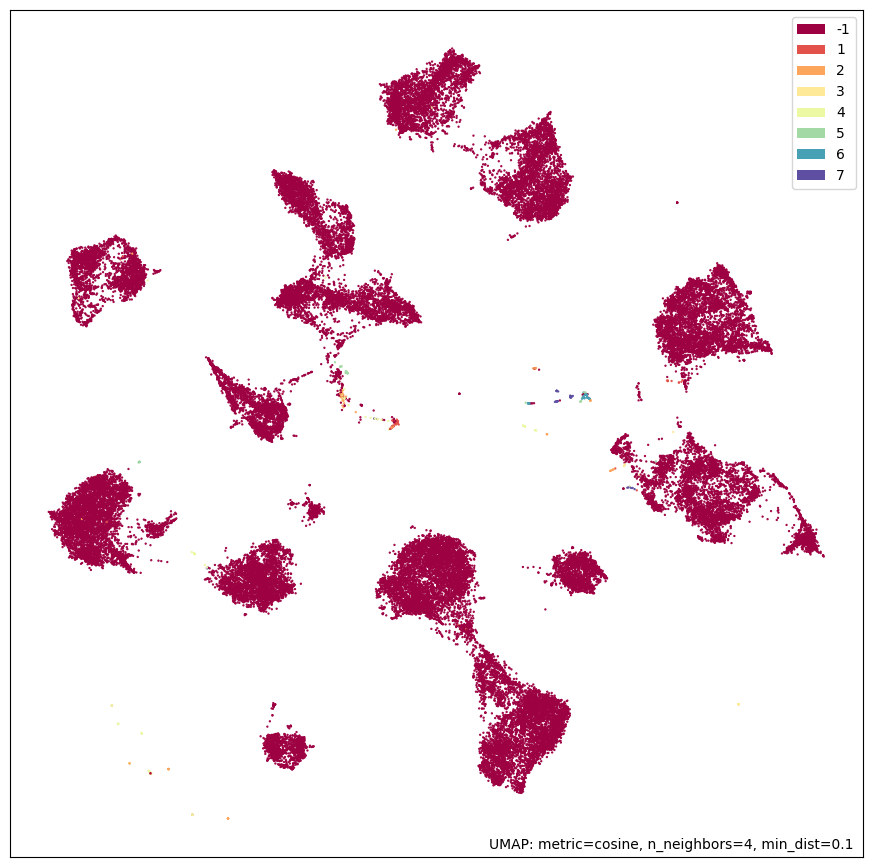

In [4]:
# Réduction de dimension avec UMAP à 2 dimensions
umap_model_2d = umap.UMAP(n_components=2,n_neighbors=4,min_dist=0.1,metric='cosine', random_state=42)
mapper=umap_model_2d.fit(df_scale)
X_reduced_2d = umap_model_2d.fit_transform(df_scale)
umap.plot.points(mapper,width=1100, height=1100,labels=target)


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\umap\plot.py:894: UserWarning: Hammer edge bundling is expensive for large graphs!
This may take a long time to compute!
  warn(


<Axes: >

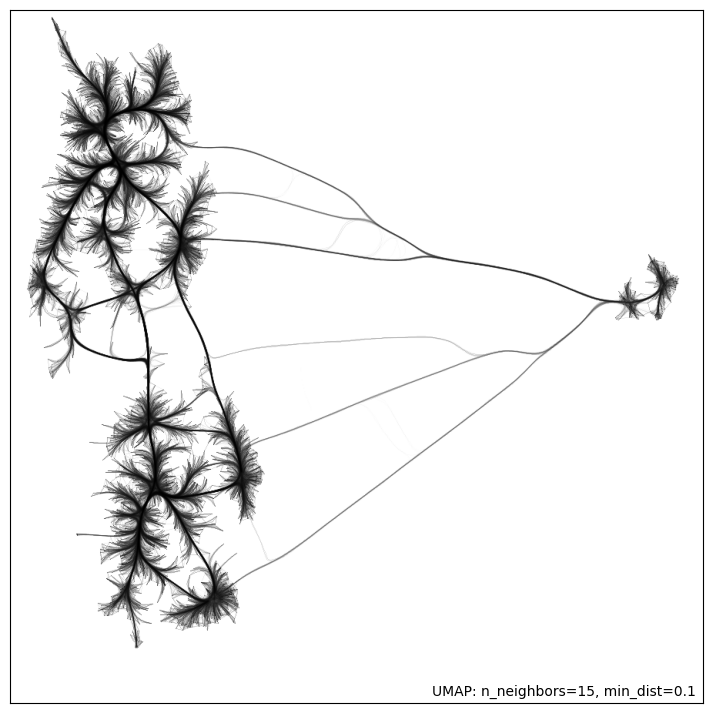

In [ ]:
umap.plot.connectivity(mapper, edge_bundling='hammer',width=900, height=900)

<Axes: >

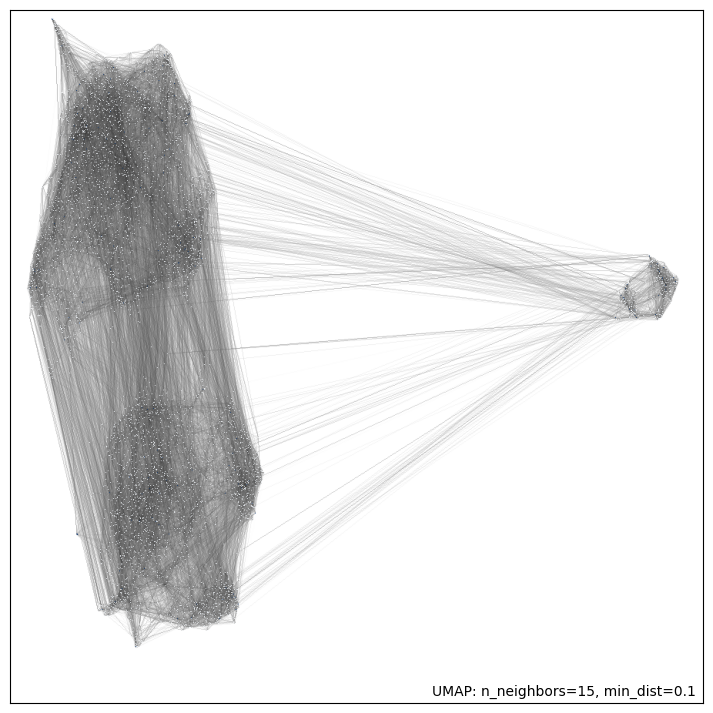

In [ ]:
umap.plot.connectivity(mapper, show_points=True,width=900, height=900)

In [5]:
umap_model_10d = umap.UMAP(n_components=10,n_neighbors=4,min_dist=0.1,metric='cosine',random_state=42)#, random_state=42)
umap_model_10d.fit(df_scale)
X_reduced_10d=umap_model_10d.transform(df_scale)

d:\Adrien et Sarah\Documents\GitHub\MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## TSNE

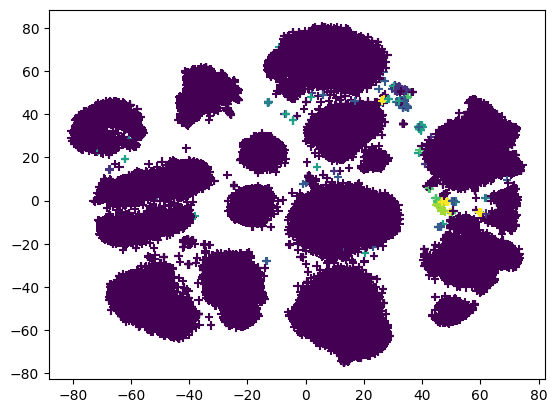

(52025, 2)

In [ ]:
tsne = TSNE(n_components=2, method = 'barnes_hut',n_jobs=-1)
df_scale = tsne.fit_transform(df_scale)
plt.scatter(df_scale[:, 0], df_scale[:, 1],c=target,marker="+")
plt.show()
df_scale.shape

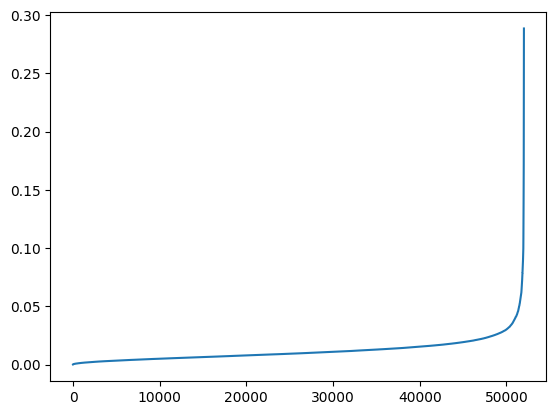

In [ ]:
# PCA
pca_var = PCA()
pca_var.fit(df_scale)

# Plot
plt.figure(figsize=(10,5))
xi = np.arange(1, 1+df_scale.shape[1], step=1)
yi = np.cumsum(pca_var.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 1+df_scale.shape[1], step=1))
plt.ylabel('Cumulative variance (%)')
plt.title('Explained variance by each component')
plt.axhline(y=1, color='r', linestyle='-')
plt.gca().xaxis.grid(False)

In [17]:
with mlflow.start_run( run_name="run_6_DBSCAN",   nested=False,  tags={"project": "Anomalie_classification", "model": "DBSCAN","Data":"all"}          ):

    db = DBSCAN(eps=0.42, min_samples=240).fit(X_reduced_2d)
    y_pred = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(y_pred)) - (1 if -1 in y_pred else 0)
    n_noise_ = list(y_pred).count(-1)

    dfig=pd.DataFrame({"xx":X_reduced_2d[:, 0],"yy": X_reduced_2d[:, 1],"colore":y_pred})
    fig = px.scatter(dfig,x='xx',y='yy',color="colore",hover_data=[df.index],width=1400,height=1000)
    fig.show()

    mlflow.log_metric('Estimated number of clusters', n_clusters_)
    mlflow.log_metric('Estimated number of noise points', n_noise_)
    mlflow.log_figure(fig, "Scatter_DBSCAN.html")  # log_figure prend la figure actuelle plt.gcf()
    mlflow.log_param('Param name', 'Value')
    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    x=sc.transform(df_ng)
    new_samples_reduced =umap_model_2d.transform(x)
    # Application de la fonction de prédiction sur les nouvelles données
    new_predictions = predict_dbscan_labels(db, X_reduced_2d, new_samples_reduced, eps=db.eps)
    dfig=pd.DataFrame({"xx":new_samples_reduced[:, 0],"yy": new_samples_reduced[:, 1],"colore":new_predictions})
    fig = px.scatter(dfig,x='xx',y='yy',color="colore",hover_data=[df_ng.index],width=1400,height=1000)
    new_predictions[new_predictions != -1] = 0
    mlflow.log_metric('Precision',np.abs(new_predictions.sum())/len(new_predictions))
    print("sommeypred",new_predictions.sum())
    print("moy acc",np.abs(new_predictions.sum())/len(new_predictions))
    if len(target)==len(y_pred):
        mlflow.log_metric('Homogeneity', metrics.homogeneity_score(target, y_pred))
        mlflow.log_metric('Completeness', metrics.completeness_score(target, y_pred))
        mlflow.log_metric('V-measure', metrics.v_measure_score(target, y_pred))
        mlflow.log_metric('Adjusted Rand Index', metrics.adjusted_rand_score(target, y_pred))
        mlflow.log_metric('Adjusted Mutual Information', metrics.adjusted_mutual_info_score(target, y_pred))
        mlflow.log_metric('Silhouette Coefficient', metrics.silhouette_score(df_scale, y_pred))
        print(f"Homogeneity: {metrics.homogeneity_score(target, y_pred):.3f}")
        print(f"Completeness: {metrics.completeness_score(target, y_pred):.3f}")
        print(f"V-measure: {metrics.v_measure_score(target, y_pred):.3f}")
        print(f"Adjusted Rand Index: {metrics.adjusted_rand_score(target, y_pred):.3f}")
        print("Adjusted Mutual Information:" f" {metrics.adjusted_mutual_info_score(target, y_pred):.3f}" )
        print(f"Silhouette Coefficient: {metrics.silhouette_score(df_scale, y_pred):.3f}")
    
    

Estimated number of clusters: 21
Estimated number of noise points: 1540
sommeypred -395
moy acc 0.8531317494600432
Homogeneity: 0.437
Completeness: 0.010
V-measure: 0.020
Adjusted Rand Index: 0.002
Adjusted Mutual Information: 0.019
Silhouette Coefficient: 0.037


2024/11/01 17:01:34 INFO mlflow.tracking._tracking_service.client: 🏃 View run run_6_DBSCAN at: https://dagshub.com/crotelius77/MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques.mlflow/#/experiments/1/runs/dfcdc524d57e4c2bb32315c8c5c9df10.
2024/11/01 17:01:34 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: https://dagshub.com/crotelius77/MLOps_Detection_Anomalies_Acoustiques_Et_Vibratoires_Moteurs_Electriques.mlflow/#/experiments/1.


In [12]:
db = DBSCAN(eps=.42, min_samples=240).fit(X_reduced_2d)
y_pred = db.labels_
n_clusters_ = len(set(y_pred)) - (1 if -1 in y_pred else 0)
n_noise_ = list(y_pred).count(-1)
print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
dfig=pd.DataFrame({"xx":X_reduced_2d[:, 0],"yy": X_reduced_2d[:, 1],"colore":y_pred})
fig = px.scatter(dfig,x='xx',y='yy',color="colore",hover_data=[df.index],width=1400,height=1000,symbol=target)
fig.show()

Estimated number of clusters: 21
Estimated number of noise points: 1540


test

In [14]:
def predict_dbscan_labels(dbscan_model, known_data, new_data, eps=0.5):
    """
    Fonction pour prédire l'étiquette DBSCAN de nouvelles données,
    en calculant la distance entre chaque point et les clusters existants.
    """
    from sklearn.neighbors import NearestNeighbors

    # Calcul des voisins les plus proches dans les données connues
    neighbors = NearestNeighbors(radius=eps)
    neighbors.fit(known_data)

    # On cherche les indices des points du cluster le plus proche (ou anomalie si isolé)
    distances, indices = neighbors.radius_neighbors(new_data)
    predictions = []

    for dist, idx in zip(distances, indices):
        # Filtrer les indices ayant une étiquette différente de -1
        cluster_labels = db.labels_[idx]
        cluster_labels = cluster_labels[cluster_labels != -1]  # Exclure les anomalies

        if len(cluster_labels) > 0:  # Si des voisins de clusters sont trouvés
            # Prend la majorité des labels des voisins trouvés
            pred_label = np.argmax(np.bincount(cluster_labels))
        else:
            pred_label = -1  # Aucun voisin trouvé -> Anomalie
        predictions.append(pred_label)

    return np.array(predictions)

# Transformation de nouvelles données avec le modèle UMAP
#x=df_ng.drop(columns="target")
x=sc.transform(df_ng)
new_samples_reduced =umap_model_2d.transform(x)

# Application de la fonction de prédiction sur les nouvelles données
new_predictions = predict_dbscan_labels(db, X_reduced_2d, new_samples_reduced, eps=db.eps)
dfig=pd.DataFrame({"xx":new_samples_reduced[:, 0],"yy": new_samples_reduced[:, 1],"colore":new_predictions})
fig = px.scatter(dfig,x='xx',y='yy',color="colore",hover_data=[df_ng.index],width=1400,height=1000)
new_predictions[new_predictions != -1] = 0
print("sommeypred",new_predictions.sum())
print("moy acc",np.abs(new_predictions.sum())/len(new_predictions))
fig.show()

sommeypred -395
moy acc 0.8531317494600432


# MODELE ROBUST COVARIANCE

In [ ]:
outliers_fraction = 0.01
warnings.filterwarnings("ignore")
el = EllipticEnvelope(contamination = outliers_fraction, support_fraction = 0.9)

In [ ]:
el.fit(pcadata)
y_pred = el.predict(pcadata)

print("nerror",(y_pred!=target).sum())
print("sommeypred",y_pred.sum())
print("Accuracy score: {}".format(accuracy_score(target, y_pred)))
print("Classification report :\n {}".format(classification_report(target, y_pred)))
print("Matrice de confusion:\n", confusion_matrix(target, y_pred))
print("#"*50)
print("ROC-AUC Score:", roc_auc_score(target, y_pred))
print("#"*50)
print("MCC Score:", matthews_corrcoef(target, y_pred))

nerror 510
sommeypred 521
Accuracy score: 0.9901970206631427
Classification report :
               precision    recall  f1-score   support

           0       1.00      0.99      1.00     51562
           1       0.45      0.51      0.48       463

    accuracy                           0.99     52025
   macro avg       0.73      0.75      0.74     52025
weighted avg       0.99      0.99      0.99     52025

Matrice de confusion:
 [[51278   284]
 [  226   237]]
##################################################
ROC-AUC Score: 0.7531855587389478
##################################################
MCC Score: 0.47762269826733295


Isolation Forest

In [ ]:
from sklearn.ensemble import IsolationForest

model = IsolationForest(n_estimators=50000, contamination=0.05)
model.fit(df_go)
y_pred = model.predict(df_ng)  # -1 pour anomalie, 1 pour normal
y_pred[y_pred == 1] = 0
print("nerror",(y_pred!=target_ng).sum())
print("sommeypred",y_pred.sum())
print("Accuracy score: {}".format(accuracy_score(target_ng, y_pred)))
print("Classification report :\n {}".format(classification_report(target_ng, y_pred)))
print("Matrice de confusion:\n", confusion_matrix(target_ng, y_pred))
print("#"*50)

y_pred = model.predict(df_go)  # -1 pour anomalie, 1 pour normal
y_pred[y_pred == 1] = 0
print("nerror",(y_pred!=target_go).sum())
print("sommeypred",y_pred.sum())
print("Accuracy score: {}".format(accuracy_score(target_go, y_pred)))
print("Classification report :\n {}".format(classification_report(target_go, y_pred)))
print("Matrice de confusion:\n", confusion_matrix(target_go, y_pred))


nerror 77
sommeypred -386
Accuracy score: 0.8336933045356372
Classification report :
               precision    recall  f1-score   support

          -1       1.00      0.83      0.91       463
           0       0.00      0.00      0.00         0

    accuracy                           0.83       463
   macro avg       0.50      0.42      0.45       463
weighted avg       1.00      0.83      0.91       463

Matrice de confusion:
 [[386  77]
 [  0   0]]
##################################################


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


nerror 2579
sommeypred -2579
Accuracy score: 0.9499825452852876
Classification report :
               precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.95      0.97     51562

    accuracy                           0.95     51562
   macro avg       0.50      0.47      0.49     51562
weighted avg       1.00      0.95      0.97     51562

Matrice de confusion:
 [[    0     0]
 [ 2579 48983]]


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


One-Class SVM

In [ ]:
from sklearn.svm import OneClassSVM

model = OneClassSVM(kernel='rbf', nu=0.1)
model.fit(df_scale)
y_pred = model.predict(df_ng)  # -1 pour anomalie, 1 pour normal
y_pred[y_pred == 1] = 0
print("nerror",(y_pred!=target_ng).sum())
print("sommeypred",y_pred.sum())
print("Accuracy score: {}".format(accuracy_score(target_ng, y_pred)))
print("Classification report :\n {}".format(classification_report(target_ng, y_pred)))
print("Matrice de confusion:\n", confusion_matrix(target_ng, y_pred))
print("#"*50)
print("ROC-AUC Score:", roc_auc_score(target_ng, y_pred))
print("#"*50)
print("MCC Score:", matthews_corrcoef(target_ng, y_pred))


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but OneClassSVM was fitted without feature names
  warnings.warn(


nerror 0
sommeypred -463
Accuracy score: 1.0
Classification report :
               precision    recall  f1-score   support

          -1       1.00      1.00      1.00       463

    accuracy                           1.00       463
   macro avg       1.00      1.00      1.00       463
weighted avg       1.00      1.00      1.00       463

Matrice de confusion:
 [[463]]
##################################################


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:409: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

In [ ]:
y_pred = model.predict(sc.transform(df_ng))  # -1 pour anomalie, 1 pour normal
y_pred[y_pred == 1] = 0
print("nerror",(y_pred!=target_ng).sum())
print("sommeypred",y_pred.sum())
print("Accuracy score: {}".format(accuracy_score(target_ng, y_pred)))
print("Classification report :\n {}".format(classification_report(target_ng, y_pred)))
print("Matrice de confusion:\n", confusion_matrix(target_ng, y_pred))
print("#"*50)

nerror 403
sommeypred -60
Accuracy score: 0.12958963282937366
Classification report :
               precision    recall  f1-score   support

          -1       1.00      0.13      0.23       463
           0       0.00      0.00      0.00         0

    accuracy                           0.13       463
   macro avg       0.50      0.06      0.11       463
weighted avg       1.00      0.13      0.23       463

Matrice de confusion:
 [[ 60 403]
 [  0   0]]
##################################################


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


LOF (Local Outlier Factor)

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

model = LocalOutlierFactor(n_neighbors=190, contamination=0.06,novelty=True)
model.fit(df_scale)  # -1 pour anomalie, 1 pour normal
#y_pred = model.predict(df_scale)
y_pred[y_pred == 1] = 0
print("nerror",(y_pred!=target).sum())
print("sommeypred",y_pred.sum())
print("Accuracy score: {}".format(accuracy_score(target, y_pred)))
print("Classification report :\n {}".format(classification_report(target, y_pred)))
print("Matrice de confusion:\n", confusion_matrix(target, y_pred))



nerror 3048
sommeypred -3048
Accuracy score: 0.9408866995073891
Classification report :
               precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.94      0.97     51562

    accuracy                           0.94     51562
   macro avg       0.50      0.47      0.48     51562
weighted avg       1.00      0.94      0.97     51562

Matrice de confusion:
 [[    0     0]
 [ 3048 48514]]


d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Adrien et Sarah\Documents\GitHub\CNI\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
y_pred = model.predict(sc.transform(df_ng))  # -1 pour anomalie, 1 pour normal
y_pred[y_pred == 1] = 0
print("sommeypred",y_pred.sum())
print("moy acc",np.abs(y_pred.sum())/len(target_ng))

sommeypred -430
moy acc 0.9287257019438445


In [ ]:
y_pred = model.decision_function(sc.transform(df_go))  # -1 pour anomalie, 1 pour normal
#
print("sommeypred",y_pred.sum())
print("moy acc",np.abs(y_pred.sum())/len(target_ng))
y_pred

sommeypred 6319.580526074435
moy acc 13.649202000160766


array([0.17038355, 0.16902736, 0.18060158, ..., 0.17298496, 0.17717699,
       0.07150451])